<a href="https://colab.research.google.com/github/DhafinRA/ML-Upatik/blob/main/Food_Classification_pt2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

IMPORT DEPENDENCIES

In [22]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Dense,Conv2D,MaxPooling2D,Dropout,Flatten,GlobalAveragePooling2D
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.applications import ResNet50V2
import seaborn as sns
from sklearn.metrics import confusion_matrix,classification_report

In [23]:
#HYPERPARAMETER

EPOCHS = 5
LOSS = CategoricalCrossentropy()
OPTIMIZERS = Adam()
input_shape = (150,150,3)
train_dir = "Image Eye\Train"
test_dir = "Image Eye\Test"

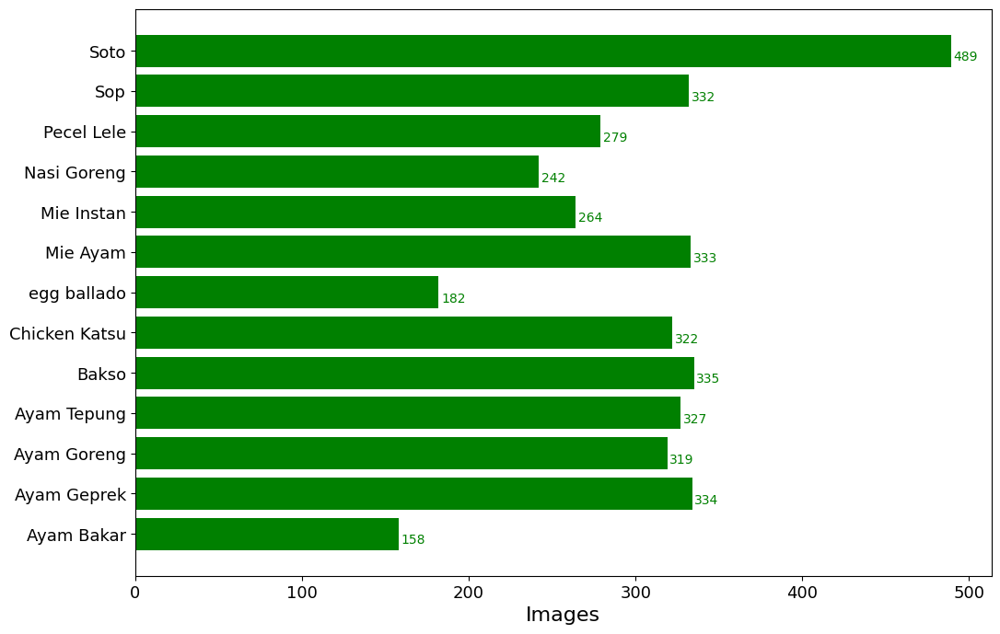

In [24]:
data=dict()

for i in os.listdir(train_dir):
    sub_dir=os.path.join(train_dir,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values]

fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

Labeling Photo Using ImageDataGenerator

In [25]:
train_datagen = ImageDataGenerator(rescale=1./255,
                                    rotation_range=40,
                                    height_shift_range=0.2,
                                    width_shift_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

Show All Classes

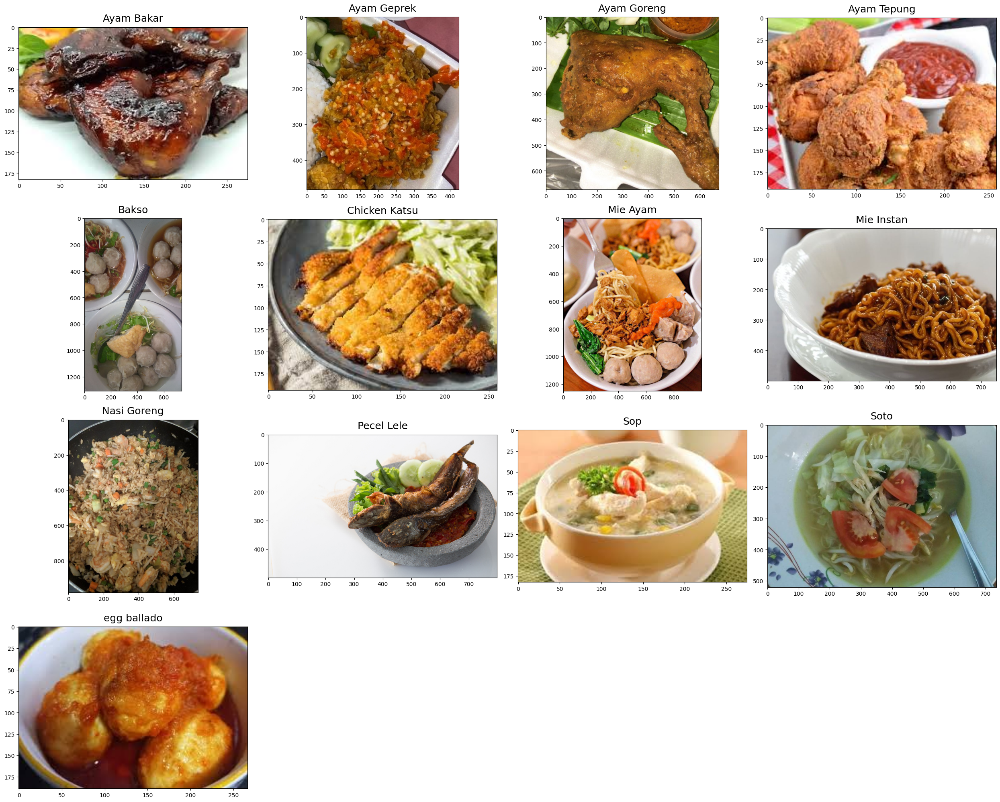

In [26]:
images = []
labels = []

for food_folder in sorted(os.listdir(train_dir)):
    food_items = os.listdir(train_dir + '/' + food_folder)
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(train_dir,food_folder,food_selected))

fig=plt.figure(1, figsize=(25, 25))

for subplot,image_ in enumerate(images):
    category=image_.split('\\')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    labels.append(category)

plt.tight_layout()

In [27]:
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(224, 224),
                                                    batch_size=10,
                                                    class_mode='categorical',
                                                    color_mode='rgb')

test_generator = test_datagen.flow_from_directory(test_dir,
                                                    target_size=(224, 224),
                                                    batch_size=2,
                                                    class_mode='categorical',
                                                    color_mode='rgb')

Found 3913 images belonging to 13 classes.
Found 882 images belonging to 13 classes.


Making Callbacks for Training

In [28]:
# class myCallback(tf.keras.callbacks.Callback):
#         def on_epoch_end(self, epoch, logs={}):
#             if (logs.get('val_accuracy') > 0.83 and logs.get('accuracy')>0.83):
#                 print('\naccuracy and validation accuracy reached 83%,so cancelling training!')
#                 self.model.stop_training = True
                
# callbacks = myCallback()

model_checkpoint_callback = ModelCheckpoint(
    filepath='Model/model.keras',
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

early_stopping = EarlyStopping(
    monitor='val_accuracy',
    verbose=1,
    mode='max',
    restore_best_weights = True,
)

In [29]:
resnet = ResNet50V2(
    weights='imagenet',
    include_top=False,
    input_shape=input_shape
)

total_layers = len(resnet.layers)

# fn_layers = total_layers - round(int(0.6 * total_layers))
# Freezing the Base Layer
for layer in resnet.layers[:-4]:
    layer.trainable = False

In [30]:
# # Initialize empty lists to store x_train and y_train
x_train_list = []
y_train_list = []
x_val_list = []
y_val_list = []


# # Iterate over the generator and collect all the batches of data for training
for i in range(len(train_generator)):
     x_train_batch, y_train_batch = train_generator[i]
     x_train_list.append(x_train_batch)
     y_train_list.append(y_train_batch)

for i in range(len(test_generator)):
     x_val_batch, y_val_batch = test_generator[i]
     x_val_list.append(x_val_batch)
     y_val_list.append(y_val_batch)


# # Concatenate the batches to get the complete x_train, y_train, x_val, and y_val arrays
x_train = np.concatenate(x_train_list)
y_train = np.concatenate(y_train_list)

x_val = np.concatenate(x_val_list)
y_val = np.concatenate(y_val_list)

# #split for test set
from sklearn.model_selection import train_test_split

x_val, x_test, y_val, y_test = train_test_split(x_val, y_val, test_size=0.67, random_state=1)

In [31]:
input_data = np.concatenate((x_train, x_val), axis=0)
target_data = np.concatenate((y_train, y_val), axis=0)
input_data.shape, target_data.shape

((4204, 224, 224, 3), (4204, 13))

In [32]:
model = Sequential([
    resnet,
    GlobalAveragePooling2D(),
    Dense(512,activation='relu'),
    Dense(64,activation='relu'),
    Dense(13,activation='softmax')
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 5, 5, 2048)        23564800  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_3 (Dense)             (None, 512)               1049088   
                                                                 
 dense_4 (Dense)             (None, 64)                32832     
                                                                 
 dense_5 (Dense)             (None, 13)                845       
                                                                 
Total params: 24,647,565
Trainable params: 2,137,485
Non-trainable params: 22,510,080
__________________________________

In [33]:
from sklearn.model_selection import KFold
# # Perform k-fold cross-validation with a seed
kfold = KFold(n_splits=5, shuffle=True, random_state=42)  # Update the number of splits and the random seed as needed

fold_no = 0
acc_per_fold = []
loss_per_fold = []
x_train_list =[]
y_train_list =[]
x_val_list =[]
y_val_list = []
best_accuracy = 0.0

val_acc_per_fold = []  # Add a list to store validation accuracy
for train_index, val_index in kfold.split(input_data):
     x_train_fold, y_train_fold = input_data[train_index], target_data[train_index]
     x_val_fold, y_val_fold = input_data[val_index], target_data[val_index]
     # Create an ImageDataGenerator for training data
     train_datagen = ImageDataGenerator(
             rotation_range=20,
             width_shift_range=0.2,
             height_shift_range=0.2,
             shear_range=0.2,
             zoom_range=0.2,
             horizontal_flip=True,
             fill_mode='nearest')

#     # Create an ImageDataGenerator for validation data
     validation_datagen = ImageDataGenerator()

#     # Generate batches of augmented data for training
     train_generator = train_datagen.flow(
         x_train_fold,
         y = y_train_fold,
         batch_size=64)

#     # Generate batches of data for validation
     validation_generator = validation_datagen.flow(
         x_val_fold,
         y = y_val_fold,
         batch_size=64)
    

#     # Print the shape of the current fold's training and validation data
     print('Training data shape:', x_train_fold.shape, y_train_fold.shape)
     print('Validation data shape:', x_val_fold.shape, y_val_fold.shape)
     model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                   loss='categorical_crossentropy',
                   metrics=['accuracy'])
     # Generate a print
     print('------------------------------------------------------------------------')
     print(f'Training for fold {fold_no} ...')
    
#     # Train the model on the current fold's data
     early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10)
     history = model.fit(train_generator,
               validation_data=validation_generator,
               epochs=50,
               callbacks=[early_stop])  # Update the number of epochs as needed

#     # Generate generalization metrics
     test_loss, test_accuracy = model.evaluate(x_test, y_test)
     print(f'Score for fold {fold_no}: {model.metrics_names[0]} of {test_loss}; {model.metrics_names[1]} of {test_accuracy*100}%')
     acc_per_fold.append(test_accuracy * 100)
     loss_per_fold.append(test_loss)
     test_last_fold=acc_per_fold[fold_no]
     print(f'test acuraccy : {acc_per_fold[fold_no]} for fold {fold_no}')
    
     val_acc_per_fold.append(max(history.history['val_accuracy']))  # Add the maximum validation accuracy to the list
     x_train_list.append(x_train_fold)
     y_train_list.append(y_train_fold)
    
     x_val_list.append(x_val_fold)
     y_val_list.append(y_val_fold)
    
     # Check if this model has the best accuracy so far
     if test_accuracy > best_accuracy:
         best_accuracy = test_accuracy
         best_model = model
         best_fold = fold_no
     # Increase fold number
     fold_no = fold_no + 1

Training data shape: (3363, 224, 224, 3) (3363, 13)
Validation data shape: (841, 224, 224, 3) (841, 13)
------------------------------------------------------------------------
Training for fold 0 ...
Epoch 1/50
53/53 [==============================] - 29s 483ms/step - loss: 1.9547 - accuracy: 0.3895 - val_loss: 1.2498 - val_accuracy: 0.6219
Epoch 2/50
53/53 [==============================] - 24s 457ms/step - loss: 1.1320 - accuracy: 0.6577 - val_loss: 0.9128 - val_accuracy: 0.7348
Epoch 3/50
53/53 [==============================] - 24s 457ms/step - loss: 0.8571 - accuracy: 0.7330 - val_loss: 0.8323 - val_accuracy: 0.7420
Epoch 4/50
53/53 [==============================] - 25s 464ms/step - loss: 0.7205 - accuracy: 0.7764 - val_loss: 0.7666 - val_accuracy: 0.7658
Epoch 5/50
53/53 [==============================] - 24s 456ms/step - loss: 0.6438 - accuracy: 0.7945 - val_loss: 0.7582 - val_accuracy: 0.7527
Epoch 6/50
53/53 [==============================] - 25s 466ms/step - loss: 0.5895 - 

Making Model

In [34]:
# model.load_weights('Weights/weight')
model.compile(loss='CategoricalCrossentropy',optimizer='adam',metrics=['accuracy'])
history = model.fit(train_generator,epochs=EPOCHS,validation_data=test_generator,callbacks=[model_checkpoint_callback])

Epoch 1/5
53/53 [==============================] - 31s 540ms/step - loss: 0.5027 - accuracy: 0.8451 - val_loss: 0.6216 - val_accuracy: 0.8163
Epoch 2/5
53/53 [==============================] - 29s 537ms/step - loss: 0.3371 - accuracy: 0.8805 - val_loss: 0.6740 - val_accuracy: 0.8333
Epoch 3/5
53/53 [==============================] - 28s 522ms/step - loss: 0.3225 - accuracy: 0.8906 - val_loss: 0.8514 - val_accuracy: 0.8016
Epoch 4/5
53/53 [==============================] - 28s 534ms/step - loss: 0.2925 - accuracy: 0.8968 - val_loss: 0.9688 - val_accuracy: 0.7937
Epoch 5/5
53/53 [==============================] - 28s 526ms/step - loss: 0.3401 - accuracy: 0.8882 - val_loss: 0.7260 - val_accuracy: 0.8016


In [35]:
# model.save_weights('Weights/weight')

RESULTS

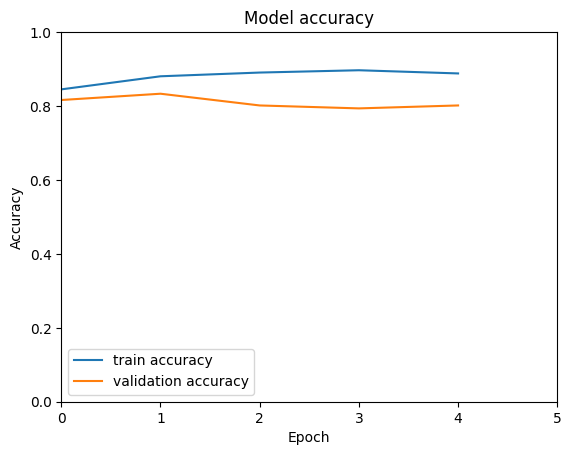

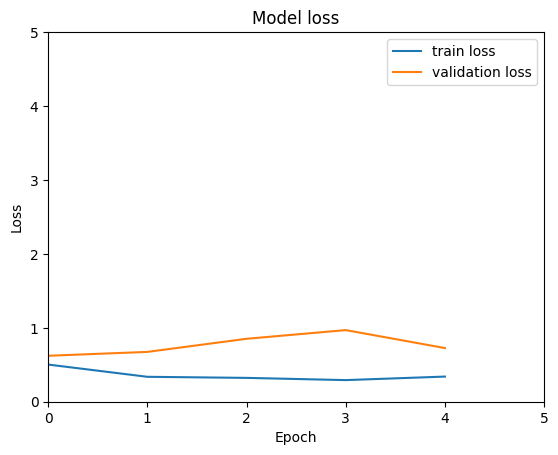

In [36]:
def plot_accuracy(history,x_axis=EPOCHS):
    plt.plot(history.history['accuracy'],label='train accuracy')
    plt.plot(history.history['val_accuracy'],label='validation accuracy')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.xlim(0,EPOCHS)
    plt.ylim(0,1)
    plt.legend(loc='best')
    plt.show()

def plot_loss(history,x_axis=EPOCHS):
    plt.plot(history.history['loss'],label="train loss")
    plt.plot(history.history['val_loss'],label="validation loss")
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.xlim(0,EPOCHS)
    plt.ylim(0,5)
    plt.legend(loc='best')
    plt.show()

plot_accuracy(history)
plot_loss(history)

In [41]:
predictions = np.argmax(model.predict(test_generator), axis=1)

cm = confusion_matrix(test_generator.labels, predictions)
clr = classification_report(test_generator.labels, predictions, target_names=test_generator.class_indices, zero_division=0)

441/441 [==============================] - 6s 13ms/step


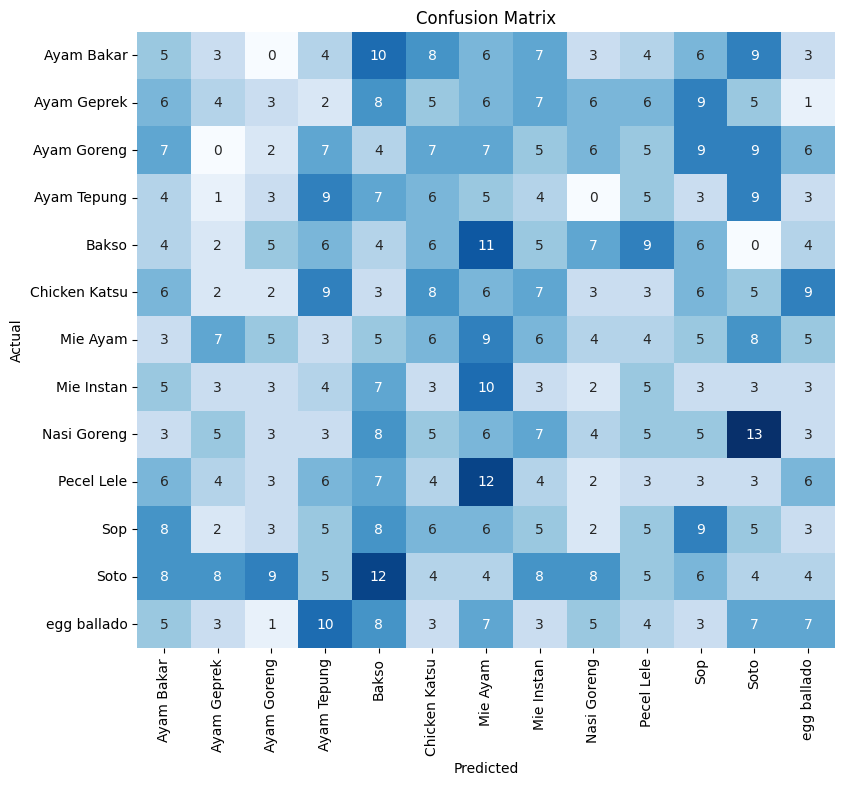

In [42]:
plt.figure(figsize=(9, 8))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
plt.xticks(ticks=np.arange(13) + 0.5, labels=test_generator.class_indices, rotation=90)
plt.yticks(ticks=np.arange(13) + 0.5, labels=test_generator.class_indices, rotation=0)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [43]:
print("Classification Report:\n----------------------\n", clr)

Classification Report:
----------------------
                precision    recall  f1-score   support

   Ayam Bakar       0.07      0.07      0.07        68
  Ayam Geprek       0.09      0.06      0.07        68
  Ayam Goreng       0.05      0.03      0.03        74
  Ayam Tepung       0.12      0.15      0.14        59
        Bakso       0.04      0.06      0.05        69
Chicken Katsu       0.11      0.12      0.11        69
     Mie Ayam       0.09      0.13      0.11        70
   Mie Instan       0.04      0.06      0.05        54
  Nasi Goreng       0.08      0.06      0.07        70
   Pecel Lele       0.05      0.05      0.05        63
          Sop       0.12      0.13      0.13        67
         Soto       0.05      0.05      0.05        85
  egg ballado       0.12      0.11      0.11        66

     accuracy                           0.08       882
    macro avg       0.08      0.08      0.08       882
 weighted avg       0.08      0.08      0.08       882



1/1 [==============================] - 1s 739ms/step
Predicted class for Image Eye\Dev\ayam bakar dev.jpg is Ayam Tepung
Class index: 3


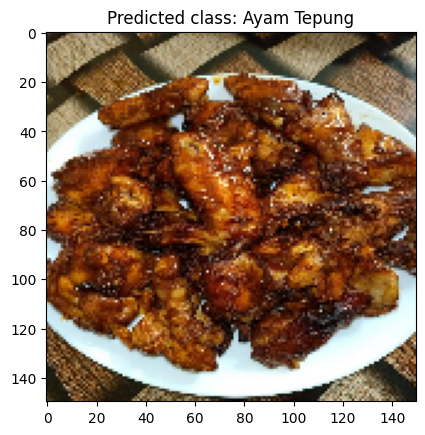

1/1 [==============================] - 0s 25ms/step
Predicted class for Image Eye\Dev\ayam goreng dev.jpg is Ayam Tepung
Class index: 3


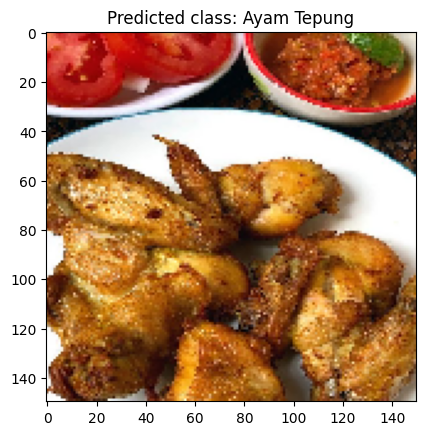

1/1 [==============================] - 0s 28ms/step
Predicted class for Image Eye\Dev\ayam tepung dev.jpg is Ayam Goreng
Class index: 2


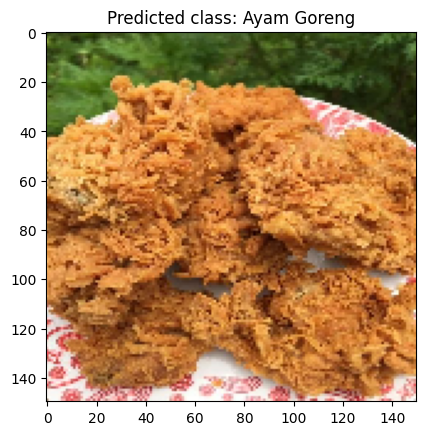

1/1 [==============================] - 0s 23ms/step
Predicted class for Image Eye\Dev\bakso dev.jpg is Bakso
Class index: 4


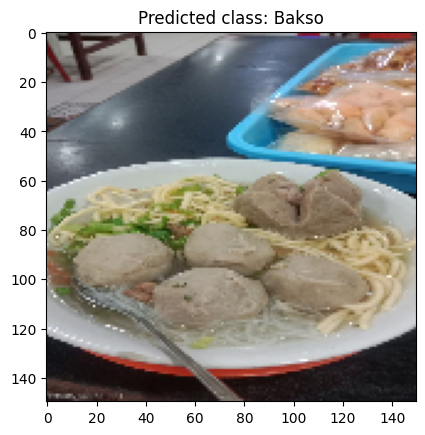

1/1 [==============================] - 0s 28ms/step
Predicted class for Image Eye\Dev\egg balado dev.jpg is Soto
Class index: 12


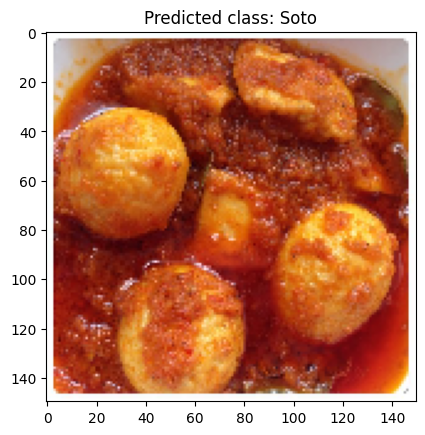

1/1 [==============================] - 0s 25ms/step
Predicted class for Image Eye\Dev\katsu dev.jpg is Chicken Katsu
Class index: 5


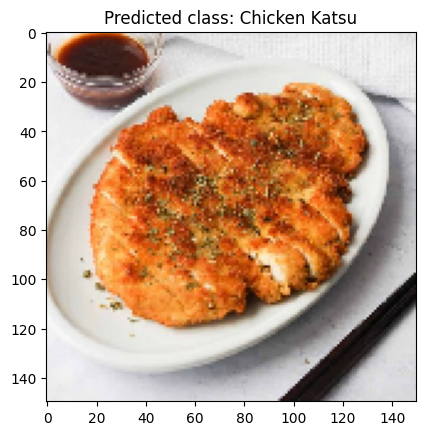

1/1 [==============================] - 0s 27ms/step
Predicted class for Image Eye\Dev\mie ayam dev.jpg is Egg Ballado
Class index: 6


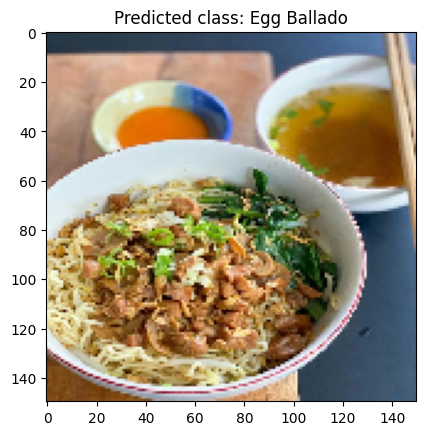

1/1 [==============================] - 0s 22ms/step
Predicted class for Image Eye\Dev\mie instan dev.jpg is Mie Ayam
Class index: 7


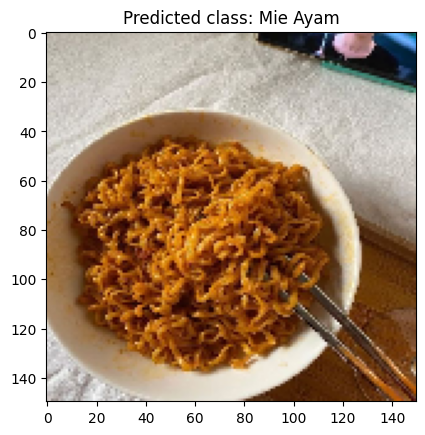

1/1 [==============================] - 0s 29ms/step
Predicted class for Image Eye\Dev\mie kuah dev.jpg is Pecel Lele
Class index: 10


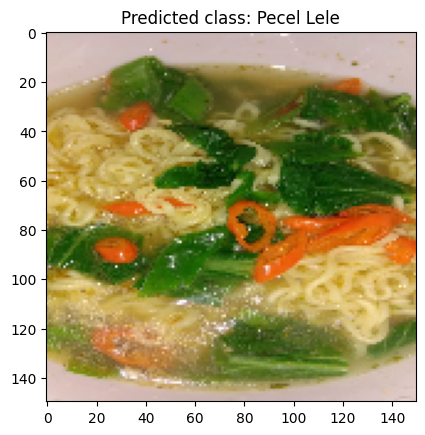

1/1 [==============================] - 0s 26ms/step
Predicted class for Image Eye\Dev\nasgot dev.jpg is Mie Instan
Class index: 8


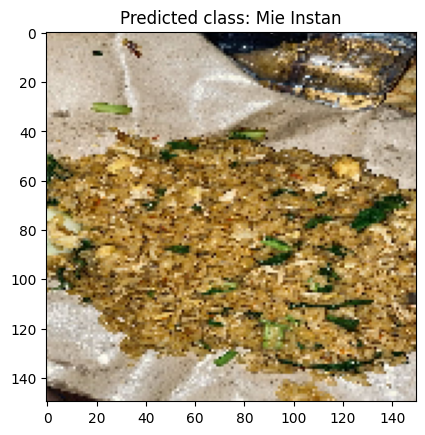

1/1 [==============================] - 0s 36ms/step
Predicted class for Image Eye\Dev\pecel lele dev.jpg is Nasi Goreng
Class index: 9


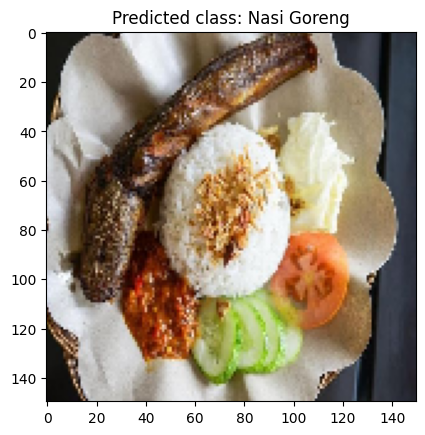

1/1 [==============================] - 0s 25ms/step
Predicted class for Image Eye\Dev\sop dev.jpg is Pecel Lele
Class index: 10


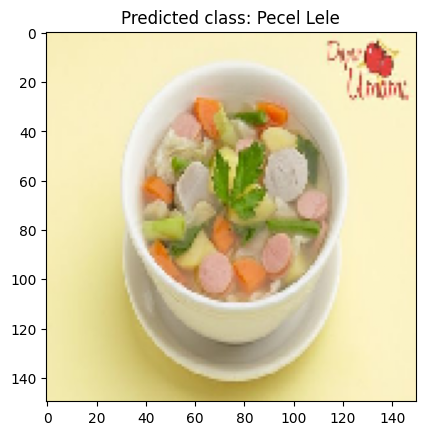

1/1 [==============================] - 0s 26ms/step
Predicted class for Image Eye\Dev\soto dev.jpg is Sop
Class index: 11


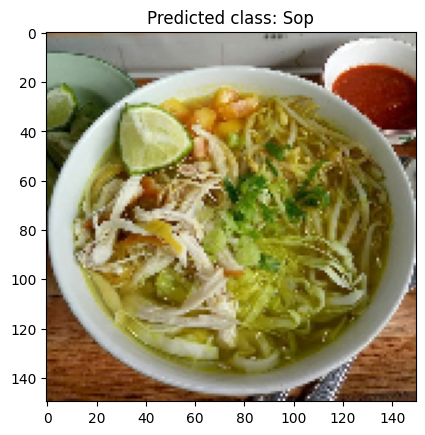

In [44]:
import os
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np
import matplotlib.pyplot as plt

class_labels = ["Ayam Bakar", "Ayam Geprek", "Ayam Goreng", "Ayam Tepung", "Bakso","Chicken Katsu", "Egg Ballado", 
                "Mie Ayam", "Mie Instan", "Nasi Goreng", "Pecel Lele", "Sop", "Soto"]

# Path to the directory containing your test images
test_dir = os.path.join('Image Eye','Dev')

# Get a list of all image files in the test directory
image_paths = [os.path.join(test_dir, file) for file in os.listdir(test_dir) if file.endswith(('.jpg', '.png', '.jpeg'))]

for image_path in image_paths:
    # Load and preprocess the image using Pillow (PIL)
    img = load_img(image_path, target_size=(150, 150))  # Load and resize the image
    x = img_to_array(img)  # Convert the image to a NumPy array
    x = x / 255.0  # Normalize the pixel values to the range [0, 1]

    # Predict using the model
    yhat = model.predict(np.expand_dims(x, axis=0))
    predicted_class = np.argmax(yhat, axis=1)[0]
    predicted_label = class_labels[predicted_class]

    print(f'Predicted class for {image_path} is {predicted_label}')
    print(f'Class index: {predicted_class}')

    plt.imshow(x)  # Display the resized image
    plt.title(f'Predicted class: {predicted_label}')
    plt.show()